# Audio & Speech Processing -- Tutorial
## by Alkis Koudounas, Ph.D. @ DBDMG

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/audio.jpeg" width="1200px">
</center>

Figure credit: [Audio Classification using Deep Learning](https://blog.neurotech.africa/audio-classification-using-deep-learning/)


What is SOUND?
==================================

**A ``sound signal`` is produced by variations in air pressure.**


> We can measure the intensity of the pressure variations: this is ``the amplitude``.
>
> The time taken for the signal to complete one full wave is ``the period.``
>
> The number of waves made by the signal in
one second is called ``the frequency``.

---

A nice GIF visualization of a raw waveform is shown below (figure credit - [MotionBolt](https://www.youtube.com/watch?v=coMhteW-sLU))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/waveform.gif" width="1200px">
</center>


Preparing data and utility functions (skip this section)
--------------------------------------------------------




In [ ]:
%matplotlib inline

In [ ]:
#@title Install libraries and useful imports. {display-mode: "form"}
#@markdown You do not need to look into this cell.
#@markdown Just execute once and you are good to go.

# uncomment this cell if running on colab
# !pip install torchaudio librosa boto3

import torch
import torchaudio
import torchaudio.functional as F
import torchaudio.transforms as T

print(torch.__version__)
print(torchaudio.__version__)

2.1.0+cu118
2.1.0+cu118


In [ ]:
#@title Install libraries and useful imports. {display-mode: "form"}
#@markdown You do not need to look into this cell.
#@markdown Just execute once and you are good to go.

# uncomment this cell if running on colab
# !pip install --upgrade transformers datasets

from datasets import load_dataset
from transformers import pipeline

In [ ]:
#@title Prepare data and utility functions. {display-mode: "form"}
#@markdown
#@markdown You do not need to look into this cell.
#@markdown Just execute once and you are good to go.
#@markdown
#@markdown In this tutorial, we will use a speech data from [VOiCES dataset](https://iqtlabs.github.io/voices/), which is licensed under Creative Commos BY 4.0.

#-------------------------------------------------------------------------------
# Preparation of data and helper functions.
#-------------------------------------------------------------------------------
import io
import os
import math
import tarfile
import multiprocessing

import scipy
import librosa
import boto3
from botocore import UNSIGNED
from botocore.config import Config
import requests
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import time
from IPython.display import Audio, display

import warnings
warnings.filterwarnings("ignore")

[width, height] = matplotlib.rcParams['figure.figsize']
if width < 10:
  matplotlib.rcParams['figure.figsize'] = [width * 2.5, height]

_SAMPLE_DIR = "_sample_data"
SAMPLE_WAV_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.wav"
SAMPLE_WAV_PATH = os.path.join(_SAMPLE_DIR, "steam.wav")

SAMPLE_WAV_SPEECH_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"
SAMPLE_WAV_SPEECH_PATH = os.path.join(_SAMPLE_DIR, "speech.wav")

SAMPLE_RIR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/room-response/rm1/impulse/Lab41-SRI-VOiCES-rm1-impulse-mc01-stu-clo.wav"
SAMPLE_RIR_PATH = os.path.join(_SAMPLE_DIR, "rir.wav")

SAMPLE_NOISE_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit/distant-16k/distractors/rm1/babb/Lab41-SRI-VOiCES-rm1-babb-mc01-stu-clo.wav"
SAMPLE_NOISE_PATH = os.path.join(_SAMPLE_DIR, "bg.wav")

SAMPLE_MP3_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.mp3"
SAMPLE_MP3_PATH = os.path.join(_SAMPLE_DIR, "steam.mp3")

SAMPLE_GSM_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/steam-train-whistle-daniel_simon.gsm"
SAMPLE_GSM_PATH = os.path.join(_SAMPLE_DIR, "steam.gsm")

SAMPLE_TAR_URL = "https://pytorch-tutorial-assets.s3.amazonaws.com/VOiCES_devkit.tar.gz"
SAMPLE_TAR_PATH = os.path.join(_SAMPLE_DIR, "sample.tar.gz")
SAMPLE_TAR_ITEM = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

S3_BUCKET = "pytorch-tutorial-assets"
S3_KEY = "VOiCES_devkit/source-16k/train/sp0307/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav"

YESNO_DATASET_PATH = os.path.join(_SAMPLE_DIR, "yes_no")
os.makedirs(YESNO_DATASET_PATH, exist_ok=True)
os.makedirs(_SAMPLE_DIR, exist_ok=True)

def _fetch_data():
  uri = [
    (SAMPLE_WAV_URL, SAMPLE_WAV_PATH),
    (SAMPLE_WAV_SPEECH_URL, SAMPLE_WAV_SPEECH_PATH),
    (SAMPLE_RIR_URL, SAMPLE_RIR_PATH),
    (SAMPLE_NOISE_URL, SAMPLE_NOISE_PATH),
    (SAMPLE_MP3_URL, SAMPLE_MP3_PATH),
    (SAMPLE_GSM_URL, SAMPLE_GSM_PATH),
    (SAMPLE_TAR_URL, SAMPLE_TAR_PATH),
  ]
  for url, path in uri:
    with open(path, 'wb') as file_:
      file_.write(requests.get(url).content)

_fetch_data()

def _download_yesno():
  if os.path.exists(os.path.join(YESNO_DATASET_PATH, "waves_yesno.tar.gz")):
    return
  torchaudio.datasets.YESNO(root=YESNO_DATASET_PATH, download=True)

YESNO_DOWNLOAD_PROCESS = multiprocessing.Process(target=_download_yesno)
YESNO_DOWNLOAD_PROCESS.start()

def _get_sample(path, resample=None):
  effects = [
    ["remix", "1"]
  ]
  if resample:
    effects.extend([
      ["lowpass", f"{resample // 2}"],
      ["rate", f'{resample}'],
    ])
  return torchaudio.sox_effects.apply_effects_file(path, effects=effects)

def get_speech_sample(*, resample=None):
  return _get_sample(SAMPLE_WAV_SPEECH_PATH, resample=resample)

def get_sample(*, resample=None):
  return _get_sample(SAMPLE_WAV_PATH, resample=resample)

def get_rir_sample(*, resample=None, processed=False):
  rir_raw, sample_rate = _get_sample(SAMPLE_RIR_PATH, resample=resample)
  if not processed:
    return rir_raw, sample_rate
  rir = rir_raw[:, int(sample_rate*1.01):int(sample_rate*1.3)]
  rir = rir / torch.norm(rir, p=2)
  rir = torch.flip(rir, [1])
  return rir, sample_rate

def get_noise_sample(*, resample=None):
  return _get_sample(SAMPLE_NOISE_PATH, resample=resample)

def print_stats(waveform, sample_rate=None, src=None):
  if src:
    print("-" * 10)
    print("Source:", src)
    print("-" * 10)
  if sample_rate:
    print("Sample Rate:", sample_rate)
  print("Shape:", tuple(waveform.shape))
  print("Dtype:", waveform.dtype)
  print(f" - Max:     {waveform.max().item():6.3f}")
  print(f" - Min:     {waveform.min().item():6.3f}")
  print(f" - Mean:    {waveform.mean().item():6.3f}")
  print(f" - Std Dev: {waveform.std().item():6.3f}")
  print()
  print(waveform)
  print()

def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def plot_specgram(waveform, sample_rate, title="Spectrogram", xlim=None):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].specgram(waveform[c], Fs=sample_rate)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
  figure.suptitle(title)
  plt.show(block=False)

def play_audio(waveform, sample_rate):
  waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(waveform[0], rate=sample_rate))
  elif num_channels == 2:
    display(Audio((waveform[0], waveform[1]), rate=sample_rate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def inspect_file(path):
  print("-" * 10)
  print("Source:", path)
  print("-" * 10)
  print(f" - File size: {os.path.getsize(path)} bytes")
  print(f" - {torchaudio.info(path)}")

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def plot_mel_fbank(fbank, title=None):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Filter bank')
  axs.imshow(fbank, aspect='auto')
  axs.set_ylabel('frequency bin')
  axs.set_xlabel('mel bin')
  plt.show(block=False)

def get_spectrogram(
    n_fft = 400,
    win_len = None,
    hop_len = None,
    power = 2.0,
):
  waveform, _ = get_speech_sample()
  spectrogram = T.Spectrogram(
      n_fft=n_fft,
      win_length=win_len,
      hop_length=hop_len,
      center=True,
      pad_mode="reflect",
      power=power,
  )
  return spectrogram(waveform)

def plot_pitch(waveform, sample_rate, pitch):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln2 = axis2.plot(
      time_axis, pitch[0], linewidth=2, label='Pitch', color='green')

  axis2.legend(loc=0)
  plt.show(block=False)

def plot_kaldi_pitch(waveform, sample_rate, pitch, nfcc):
  figure, axis = plt.subplots(1, 1)
  axis.set_title("Kaldi Pitch Feature")
  axis.grid(True)

  end_time = waveform.shape[1] / sample_rate
  time_axis = torch.linspace(0, end_time,  waveform.shape[1])
  axis.plot(time_axis, waveform[0], linewidth=1, color='gray', alpha=0.3)

  time_axis = torch.linspace(0, end_time, pitch.shape[1])
  ln1 = axis.plot(time_axis, pitch[0], linewidth=2, label='Pitch', color='green')
  axis.set_ylim((-1.3, 1.3))

  axis2 = axis.twinx()
  time_axis = torch.linspace(0, end_time, nfcc.shape[1])
  ln2 = axis2.plot(
      time_axis, nfcc[0], linewidth=2, label='NFCC', color='blue', linestyle='--')

  lns = ln1 + ln2
  labels = [l.get_label() for l in lns]
  axis.legend(lns, labels, loc=0)
  plt.show(block=False)

DEFAULT_OFFSET = 201
SWEEP_MAX_SAMPLE_RATE = 48000
DEFAULT_LOWPASS_FILTER_WIDTH = 6
DEFAULT_ROLLOFF = 0.99
DEFAULT_RESAMPLING_METHOD = 'sinc_interpolation'

def _get_log_freq(sample_rate, max_sweep_rate, offset):
  """Get freqs evenly spaced out in log-scale, between [0, max_sweep_rate // 2]

  offset is used to avoid negative infinity `log(offset + x)`.

  """
  half = sample_rate // 2
  start, stop = math.log(offset), math.log(offset + max_sweep_rate // 2)
  return torch.exp(torch.linspace(start, stop, sample_rate, dtype=torch.double)) - offset

def _get_inverse_log_freq(freq, sample_rate, offset):
  """Find the time where the given frequency is given by _get_log_freq"""
  half = sample_rate // 2
  return sample_rate * (math.log(1 + freq / offset) / math.log(1 + half / offset))

def _get_freq_ticks(sample_rate, offset, f_max):
  # Given the original sample rate used for generating the sweep,
  # find the x-axis value where the log-scale major frequency values fall in
  time, freq = [], []
  for exp in range(2, 5):
    for v in range(1, 10):
      f = v * 10 ** exp
      if f < sample_rate // 2:
        t = _get_inverse_log_freq(f, sample_rate, offset) / sample_rate
        time.append(t)
        freq.append(f)
  t_max = _get_inverse_log_freq(f_max, sample_rate, offset) / sample_rate
  time.append(t_max)
  freq.append(f_max)
  return time, freq

def plot_sweep(waveform, sample_rate, title, max_sweep_rate=SWEEP_MAX_SAMPLE_RATE, offset=DEFAULT_OFFSET):
  x_ticks = [100, 500, 1000, 5000, 10000, 20000, max_sweep_rate // 2]
  y_ticks = [1000, 5000, 10000, 20000, sample_rate//2]

  time, freq = _get_freq_ticks(max_sweep_rate, offset, sample_rate // 2)
  freq_x = [f if f in x_ticks and f <= max_sweep_rate // 2 else None for f in freq]
  freq_y = [f for f in freq if f >= 1000 and f in y_ticks and f <= sample_rate // 2]

  figure, axis = plt.subplots(1, 1)
  axis.specgram(waveform[0].numpy(), Fs=sample_rate)
  plt.xticks(time, freq_x)
  plt.yticks(freq_y, freq_y)
  axis.set_xlabel('Original Signal Frequency (Hz, log scale)')
  axis.set_ylabel('Waveform Frequency (Hz)')
  axis.xaxis.grid(True, alpha=0.67)
  axis.yaxis.grid(True, alpha=0.67)
  figure.suptitle(f'{title} (sample rate: {sample_rate} Hz)')
  plt.show(block=True)

def get_sine_sweep(sample_rate, offset=DEFAULT_OFFSET):
    max_sweep_rate = sample_rate
    freq = _get_log_freq(sample_rate, max_sweep_rate, offset)
    delta = 2 * math.pi * freq / sample_rate
    cummulative = torch.cumsum(delta, dim=0)
    signal = torch.sin(cummulative).unsqueeze(dim=0)
    return signal

def benchmark_resample(
    method,
    waveform,
    sample_rate,
    resample_rate,
    lowpass_filter_width=DEFAULT_LOWPASS_FILTER_WIDTH,
    rolloff=DEFAULT_ROLLOFF,
    resampling_method=DEFAULT_RESAMPLING_METHOD,
    beta=None,
    librosa_type=None,
    iters=5
):
  if method == "functional":
    begin = time.time()
    for _ in range(iters):
      F.resample(waveform, sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                 rolloff=rolloff, resampling_method=resampling_method)
    elapsed = time.time() - begin
    return elapsed / iters
  elif method == "transforms":
    resampler = T.Resample(sample_rate, resample_rate, lowpass_filter_width=lowpass_filter_width,
                           rolloff=rolloff, resampling_method=resampling_method, dtype=waveform.dtype)
    begin = time.time()
    for _ in range(iters):
      resampler(waveform)
    elapsed = time.time() - begin
    return elapsed / iters
  elif method == "librosa":
    waveform_np = waveform.squeeze().numpy()
    begin = time.time()
    for _ in range(iters):
      librosa.resample(waveform_np, sample_rate, resample_rate, res_type=librosa_type)
    elapsed = time.time() - begin
    return elapsed / iters


How do we represent sound digitally?
==================================

**``To digitize a sound wave`` we must turn the signal into a series of numbers.**


> In this way, we can serve it as input to our models.
>
> This is done by measuring the amplitude of the sound at ``fixed intervals of time``.
>
> Each such measurement is called a sample, and the ``sample rate`` is the number of samples per second.

---

This illustrated image image simply shows the discretization process (figure credit - [Discrete Fourier Transform](https://www.youtube.com/watch?v=mkGsMWi_j4Q))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/waveform_digitalized.gif" width="600px">
</center>


Preparing audio data for a deep learning model
==================================

Until a few years ago, machine learning applications of audio used to depend on ``traditional digital signal processing techniques`` to extract features, which required a lot of ``domain-specific expertise`` to solve the problems and tune the system for better performance.

In recent years though, with deep learning, we can rely on ``standard data preparation`` without requiring a lot of manual and custom generation of features. What is more interesting is that, with deep learning, we don’t actually deal with audio data in its raw form (at least, until very recently...).

**The common approach is to ``convert the audio data into images`` and then use a standard CNN architecture to process those images. This is done by generating ``spectrograms`` from the audio.**

---

Here you can see an example of a deep learning architecture taking as input a spectrogram. We are going to explore the architecture in a few moments (figure credit - [Deep Learning for Audio Classification](https://www.youtube.com/watch?v=Z7YM-HAz-IY))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/deep_learning_features.jpeg" width="1200px">
</center>


Spectrum
==================================

Any signal consists of many distinct frequencies and it can be expressed as the sum of those frequencies.

**``The spectrum is the set of frequencies`` combined together to produce a signal.**

The lowest frequency in a signal called the ``fundamental frequency``. Frequencies that are multiples of the fundamental frequency are known as ``harmonics``.


---

The image here shows a waveform and its associated spectrum (figure credit - [Vowel Waveform and Spectrum](https://acousticscale.org/wiki/index.php/File:Vowel_Waveform_and_Spectrum.pdf.html))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/spectrum_waveform.png" width="1200px">
</center>


Time Domain vs Frequency Domain
==================================

The waveforms we saw earlier showing ``Amplitude against Time`` are one way to represent a sound signal. Since the x-axis shows the range of time values of the signal, we are viewing the signal in the **Time Domain**.

The spectrum is an alternate way to represent the same signal. It shows ``Amplitude against Frequency``, and since the x-axis shows the range of frequency values of the signal, at a moment in time, we are viewing the signal in the **Frequency Domain**.

---

The image here shows time vs frequency domains (figure credit - [EdaDocs: Time & Frequency domains](https://edadocs.software.keysight.com/kkbopen/why-measuring-in-the-time-domain-and-frequency-domain-is-the-same-but-not-603167255.html))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/time_frequency_domain.jpeg" width="1200px">
</center>


Spectrograms
==================================

Since a signal produces different sounds as it varies over time, its constituent frequencies also vary with time. In other words, its spectrum varies with time.

**A spectrogram of a signal plots its spectrum over time and is like a ``photograph of the signal``**. It plots time on the x-axis and frequency on the y-axis.

It uses different colors to indicate the Amplitude or strength of each frequency. Each vertical ‘slice’ of the spectrogram is the spectrum of the signal at a specific instant in time and it shows how the signal strength is distributed in every frequency found in the signal at that instant.

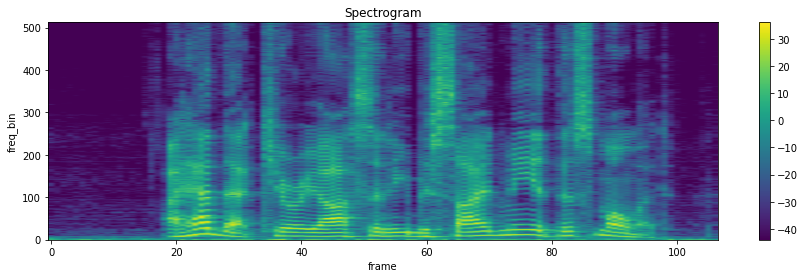

In [ ]:
## Plot the spectrogram of an audio sample
waveform, sample_rate = get_speech_sample()
play_audio(waveform, sample_rate)
print("")

n_fft = 1024
win_length = None
hop_length = 512

# Define transformation
spectrogram = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=2.0,
)

# Perform transformation
spec = spectrogram(waveform)

# print_stats(spec)
plot_spectrogram(spec[0], title='Spectrogram')

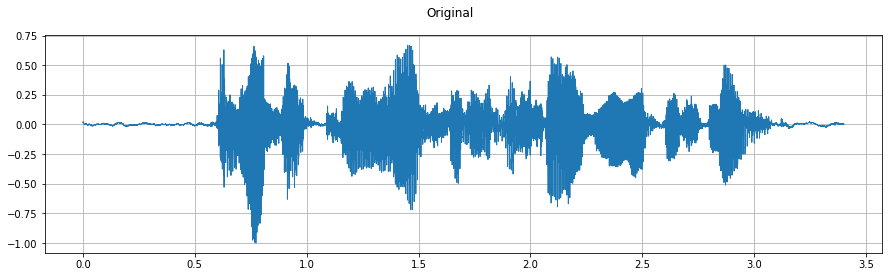

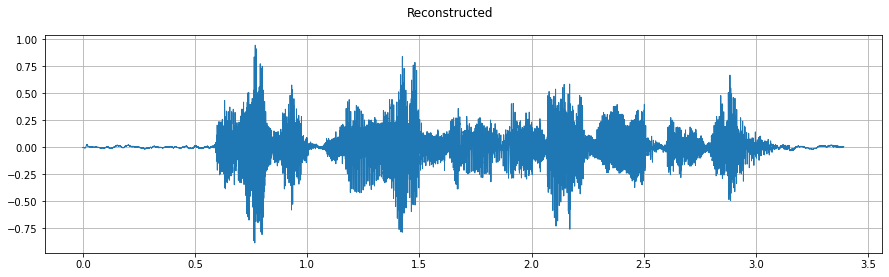

In [ ]:
## Retrieve the waveform from a spectrogram using GriffinLim

# Take the original audio file
torch.random.manual_seed(0)
waveform, sample_rate = get_speech_sample()
plot_waveform(waveform, sample_rate, title="Original")
print("")
play_audio(waveform, sample_rate)
print("\n\n")

# Apply transformation
n_fft = 1024
win_length = None
hop_length = 512

spec = T.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)(waveform)

# Retrieve the original waveform
griffin_lim = T.GriffinLim(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
)
waveform = griffin_lim(spec)

plot_waveform(waveform, sample_rate, title="Reconstructed")
print("")
play_audio(waveform, sample_rate)


Audio Deep Learning Models
==================================

Most deep learning audio applications use spectrograms to represent audio (or at least they did...)

They usually follow a procedure like this:
> ``Start with raw audio data`` in the form of a wave file.
>
> Convert the audio data into its ``corresponding spectrogram``.
>
> Optionally, use ``simple audio processing techniques`` to augment the spectrogram data.
>
> Use ``standard CNN architectures to process them and extract feature maps``, that are an encoded representation of the spectrogram image.
>
> ``Generate output predictions`` from this encoded representation, depending on the problem needed to be solved.

---

The image here shows a simple deep learning architecture for audio (figure credit - [iProbe: Spkr Recognition](https://iprobe.cse.msu.edu/project_detail.php?id=11&?title=Speaker_recognition_from_degraded_audio_samples))

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/deep_learning_architecture_example.png" width="1200px">
</center>

## Resampling an audio file

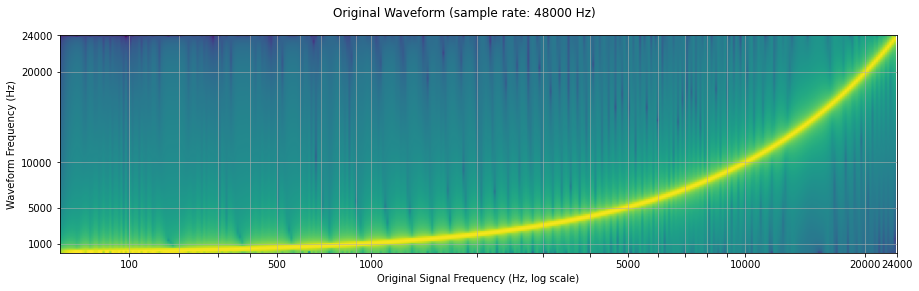

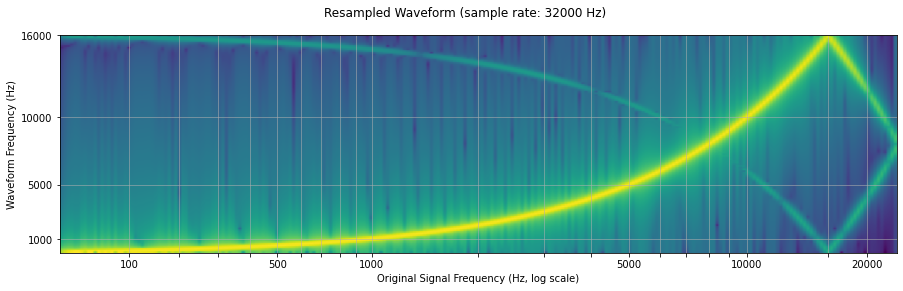

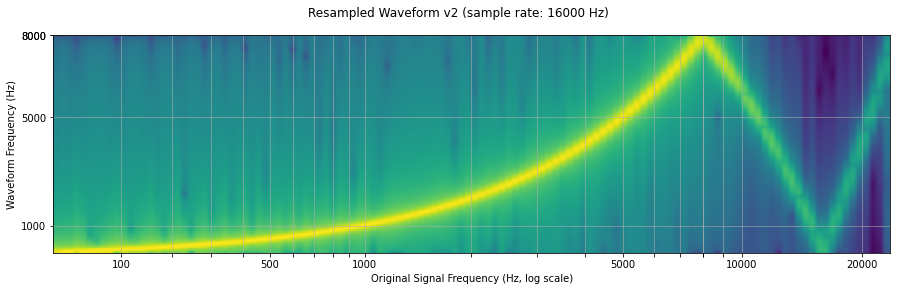

In [ ]:
# To resample an audio waveform from one freqeuncy to another,
# you can use transforms.Resample or functional.resample.
# transforms.Resample precomputes and caches the kernel used for resampling,
# while functional.resample computes it on the fly, so using transforms.Resample will result
# in a speedup if resampling multiple waveforms using the same parameters
sample_rate = 48000
resample_rate = 32000
resample_rate_1 = 16000

waveform = get_sine_sweep(sample_rate)
plot_sweep(waveform, sample_rate, title="Original Waveform")
print("")
play_audio(waveform, sample_rate)
print("\n\n")

resampler = T.Resample(sample_rate, resample_rate, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)
plot_sweep(resampled_waveform, resample_rate, title="Resampled Waveform")
print("")
play_audio(waveform, resample_rate)
print("\n\n")

resampler = T.Resample(sample_rate, resample_rate_1, dtype=waveform.dtype)
resampled_waveform = resampler(waveform)
plot_sweep(resampled_waveform, resample_rate_1, title="Resampled Waveform v2")
print("")
play_audio(waveform, resample_rate_1)

## Some Data Augmentation techniques

This is the original audio, with the corresponding spectrogram


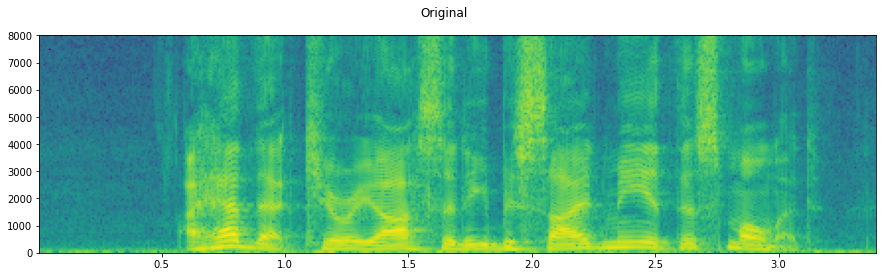

In [ ]:
sample_rate = 16000
speech, _ = get_speech_sample(resample=sample_rate)

print("This is the original audio, with the corresponding spectrogram")
plot_specgram(speech, sample_rate, title="Original")
print("")
play_audio(speech, sample_rate)

This is the audio uttered as it was recorded in a conference room, with the corresponding spectrogram


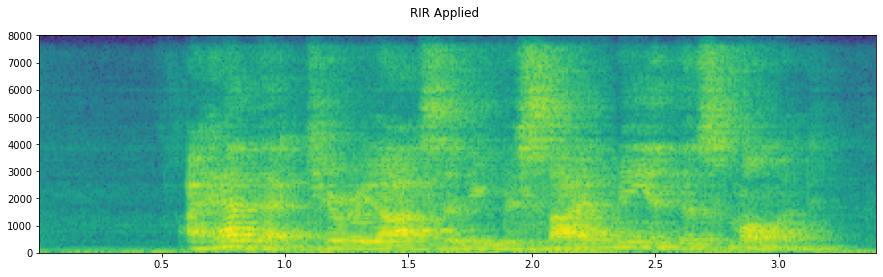

In [ ]:
# Simulating Room Impulse Reverberation (RIR)
# Using Room Impulse Response (RIR), we can make a clean speech sound like uttered in a conference room
rir, _ = get_rir_sample(resample=sample_rate, processed=True)
speech_ = torch.nn.functional.pad(speech, (rir.shape[1]-1, 0))
speech = torch.nn.functional.conv1d(speech_[None, ...], rir[None, ...])[0]

print("This is the audio uttered as it was recorded in a conference room, with the corresponding spectrogram")
plot_specgram(speech, sample_rate, title="RIR Applied")
print("")
play_audio(speech, sample_rate)

This is the audio with some background noise added, with the corresponding spectrogram


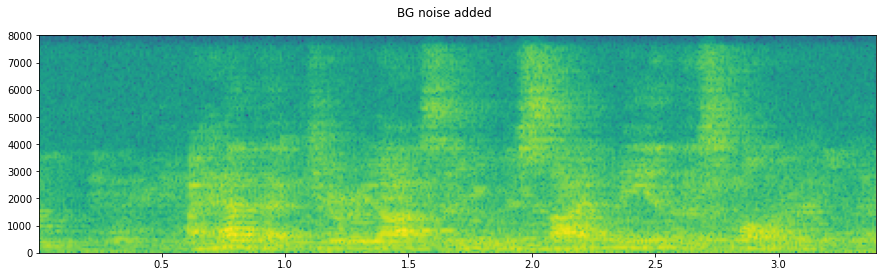

In [ ]:
# Addding background noise to audio data
noise, _ = get_noise_sample(resample=sample_rate)
noise = noise[:, :speech.shape[1]]

snr_db = 8
scale = math.exp(snr_db / 10) * noise.norm(p=2) / speech.norm(p=2)
speech = (scale * speech + noise) / 2

print("This is the audio with some background noise added, with the corresponding spectrogram")
plot_specgram(speech, sample_rate, title="BG noise added")
print("")
play_audio(speech, sample_rate)

This is the audio after a low pass filter, with the corresponding spectrogram


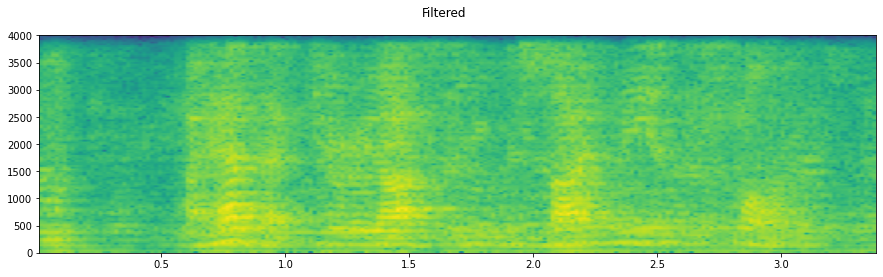

In [ ]:
# Applying filtering and changing sample rate
speech, sample_rate = torchaudio.sox_effects.apply_effects_tensor(
  speech,
  sample_rate,
  effects=[
      ["lowpass", "4000"],
      ["compand", "0.02,0.05", "-60,-60,-30,-10,-20,-8,-5,-8,-2,-8", "-8", "-7", "0.05"],
      ["rate", "8000"],
  ],
)

print("This is the audio after a low pass filter, with the corresponding spectrogram")
plot_specgram(speech, sample_rate, title="Filtered")
print("")
play_audio(speech, sample_rate)

## Some Feature Augmentation techniques with SpecAugment

------- Time Stretch -------


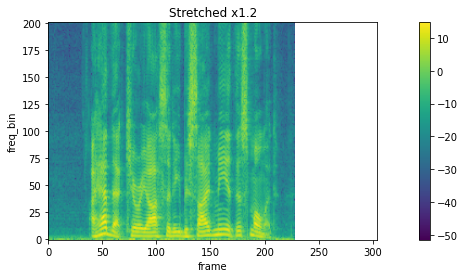

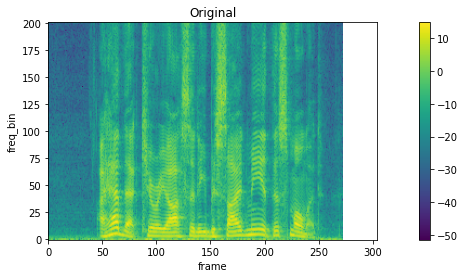

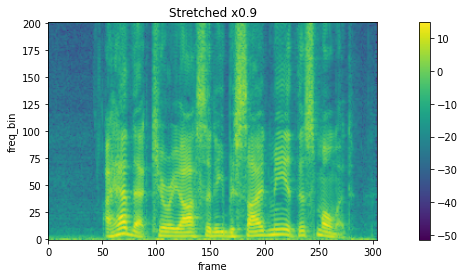

In [ ]:
# Time Stretch
print("------- Time Stretch -------")
spec = get_spectrogram(power=None)
strech = T.TimeStretch()

rate = 1.2
spec_ = strech(spec, rate)
plot_spectrogram(spec_[0].abs(), title=f"Stretched x{rate}", aspect='equal', xmax=304)

plot_spectrogram(spec[0].abs(), title="Original", aspect='equal', xmax=304)

rate = 0.9
spec_ = strech(spec, rate)
plot_spectrogram(spec_[0].abs(), title=f"Stretched x{rate}", aspect='equal', xmax=304)

------- Time Masking -------


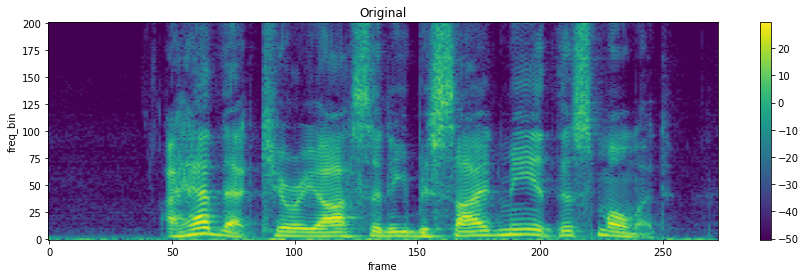

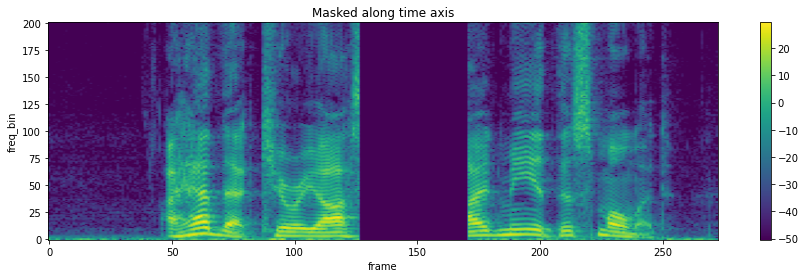

In [ ]:
# Time Masking
print("------- Time Masking -------")
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.TimeMasking(time_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along time axis")

----- Frequency Masking -----


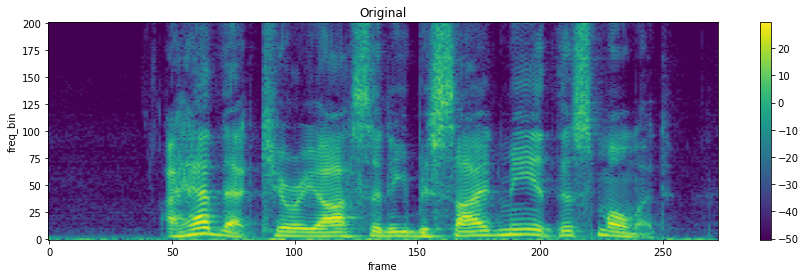

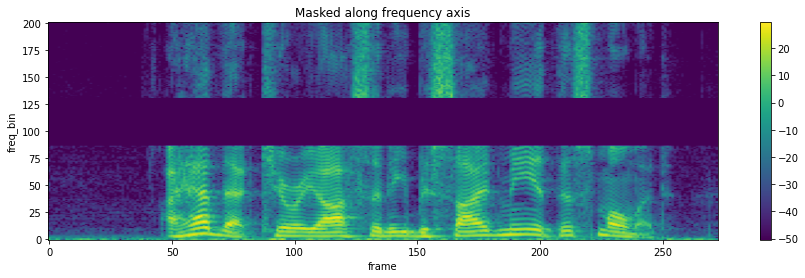

In [ ]:
# Frequency Masking
print("----- Frequency Masking -----")
torch.random.manual_seed(4)

spec = get_spectrogram()
plot_spectrogram(spec[0], title="Original")

masking = T.FrequencyMasking(freq_mask_param=80)
spec = masking(spec)

plot_spectrogram(spec[0], title="Masked along frequency axis")


What problems does audio deep learning solve?
==================================

**Audio data in day-to-day life can come in innumerable forms.**

Given the prevalence of sounds in our lives and the range of sound types, it is not surprising that there are a huge number of scenarios that require us to process and analyze audio. Now that deep learning has come of age, it can be applied to solve a number of use cases.

Here are some of the hot-topics nowadays.

## Audio Classification

This is one of the most common use cases and involves **taking a sound and assigning it to one of several classes.**

For instance, the task could be to identify the type or source of the sound. e.g., is this a car starting, is this a hammer, a whistle, or a dog barking.

But it could also be a speech-related task, e.g., to identify the emotion of an utterance, or the intent, or the specific keyword spoken, or even who is the speaker.

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/audio_classification.png" width="1200px">
</center>

Figure credit: [tiensu](https://tiensu.github.io/blog/70_audio_deep_learning_part_4/)

### Speaker Identification

Here the task is to **identify the speaker from a given audio sample**. This is a very common task in the field of speech recognition and is used in many applications, such as voice biometrics.

In [ ]:
dataset = load_dataset("anton-l/superb_demo", "si", split="test")
classifier = pipeline("audio-classification", model="superb/wav2vec2-base-superb-sid")

label2name = {
    "id10003": "David Suchet",
    "id10004": "Aaron Tveit",
    "id10005": "Aaron Yoo",
    "id10840": "India de Beaufort",
    "id10005": "Abigail Breslin",
    "id10008": "Kim Raver"
}

In [ ]:
audio = dataset[5]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))

In [ ]:
label = classifier(dataset[5]["file"], top_k=1)
print(label)
print("The speaker is: ", label2name[label[0]["label"]])

[{'score': 0.998068630695343, 'label': 'id10008'}]
The speaker is:  Kim Raver


### Emotion Recognition

Here the task is to **identify the emotion of a speaker from a given audio sample**. This task leverages the paralinguistic information that is used in speech recognition systems.

In [ ]:
dataset = load_dataset("anton-l/superb_demo", "er", split="session1")
classifier = pipeline("audio-classification", model="superb/wav2vec2-base-superb-er")

In [ ]:
audio = dataset[0]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
label = classifier(dataset[0]["file"], top_k=1)
print(label)

audio = dataset[2]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
label = classifier(dataset[2]["file"], top_k=1)
print(label)

[{'score': 0.9869334697723389, 'label': 'hap'}]


[{'score': 0.9987741112709045, 'label': 'ang'}]


### Intent Classification

Here the task is to **identify the intent of an utterance from a given audio sample**. This task involves the use of semantic information that is used in speech recognition systems, being one of the most important tasks in the field of Spoken Language Understanding (SLU).

In [ ]:
dataset = load_dataset("anton-l/superb_demo", "ic", split="test")
classifier = pipeline("audio-classification", model="superb/wav2vec2-base-superb-ic")

In [ ]:
audio = dataset[0]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
label = classifier(dataset[0]["file"], top_k=3)
print("Action: ", label[2]["label"])
print("Object: ", label[0]["label"])
print("Location: ", label[1]["label"])

print("The predicted intent is: ", f'{label[2]["label"]} {label[0]["label"]} ({label[1]["label"]})')

Action:  activate
Object:  lights
Location:  none_location
The predicted intent is:  activate lights (none_location)


### Keyword Spotting

Here the task is to **identify the presence of a specific keyword in a given audio sample**. This task is used in many applications, such as voice assistants, smart speakers, and smart home devices.

In [ ]:
dataset = load_dataset("anton-l/superb_demo", "ks", split="test")
classifier = pipeline("audio-classification", model="superb/wav2vec2-base-superb-ks")

In [ ]:
audio = dataset[5]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
label = classifier(dataset[5]["file"], top_k=1)
print(label)

audio = dataset[7]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
label = classifier(dataset[7]["file"], top_k=1)
print(label)

[{'score': 0.9999951124191284, 'label': 'go'}]


[{'score': 0.9973770380020142, 'label': 'no'}]


## Speech to Text

When dealing with human speech, but understand what they are saying.

This involves **extracting the words from the audio,** in the language in which it is spoken and transcribing it into text sentences.

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/speech_to_text.png" width="1200px">
</center>

Figure credit: [Regendus](https://www.regendus.com/best-speech-to-text-apps/)

In [ ]:
from huggingsound import SpeechRecognitionModel
model = SpeechRecognitionModel("jonatasgrosman/wav2vec2-large-xlsr-53-english")

dataset = load_dataset("anton-l/superb_demo", "si", split="test")

In [ ]:
audio = dataset[4]["audio"]
display(Audio(audio["array"], rate=audio["sampling_rate"]))
transcription = model.transcribe([audio["path"]])

print(f"\n{transcription[0]['transcription']}")

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


for like nine hours so i'm pretty pretty crazy


## Text to Speech

Conversely, with Speech Synthesis, or Text to Speech, one could go in the other direction and **take written text and generate speech from it**, using, for instance, an artificial voice for conversational agents.

The most well-known examples that have achieved widespread use are virtual assistants like Alexa, Siri, Cortana, and Google Home, which are consumer-friendly products built around this capability.

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/text_to_speech.png" width="1200px">
</center>


In [ ]:
#@title Voice of the actor the model is going to simulate. {display-mode: "form"}
#@markdown Don't look at this cell until you figured out the voice.

voice = 'freeman'

In [ ]:
# !pip install -U scipy

# !git clone https://github.com/jnordberg/tortoise-tts.git
%cd tortoise-tts

# !pip install transformers==4.19.0
# !pip install -r requirements.txt
# !python setup.py install

In [ ]:
from tortoise.api import TextToSpeech
from tortoise.utils.audio import load_audio, load_voice, load_voices

# This will download all the models used by Tortoise from the HuggingFace hub.
tts = TextToSpeech()

In [ ]:
# This is the text that will be spoken.
text = "While reading this short sentence, I am simulating the voice of a famous actor. \
    Are you able to guess who am I?"

# Pick a "preset mode" to determine quality. Options: {"ultra_fast", "fast" (default), "standard", "high_quality"}. See docs in api.py
preset = "high_quality"

In [ ]:
voice_samples, conditioning_latents = load_voice(voice)
gen = tts.tts_with_preset(text, voice_samples=voice_samples, conditioning_latents=conditioning_latents,
                          preset=preset)
torchaudio.save('../audio/tts_audio.wav', gen.squeeze(0).cpu(), 24000)
%cd ../

In [ ]:
Audio('audio/tts_audio.wav')

## Speech Translation

Speech-to-speech translation (STST or S2ST) is a relatively new spoken language processing task. It involves **translating speech from one langauge into speech in a different language**.

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/speech_translation.png" width="1200px">
</center>

STST can be viewed as an extension of the traditional machine translation (MT) task: instead of translating text from one language into another, we translate speech from one language into another. STST holds applications in the field of **multilingual communication**, enabling speakers in different languages to communicate with one another through the medium of speech.

In [ ]:
import torch
from transformers import pipeline
from datasets import load_dataset
from transformers import SpeechT5Processor, SpeechT5ForTextToSpeech, SpeechT5HifiGan

def translate(audio):
    outputs = pipe(audio, max_new_tokens=256, generate_kwargs={"task": "translate"})
    return outputs["text"]

def synthesise(text):
    inputs = processor(text=text, return_tensors="pt")
    speech = model.generate_speech(
        inputs["input_ids"].to(device), speaker_embeddings.to(device), vocoder=vocoder
        )
    return speech.cpu()

mapping = {
    "0": "en-US",
    "5": "it-IT",
    }

device = "cuda:0" if torch.cuda.is_available() else "cpu"
pipe = pipeline(
    "automatic-speech-recognition", model="openai/whisper-base", device=device
    )

dataset = load_dataset("facebook/voxpopuli", "it", split="validation", streaming=True)
sample = next(iter(dataset))

processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")

model = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts").to(device)
vocoder = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan").to(device)

embeddings_dataset = load_dataset("Matthijs/cmu-arctic-xvectors", split="validation")
speaker_embeddings = torch.tensor(embeddings_dataset[7306]["xvector"]).unsqueeze(0)

In [ ]:
print("Original text, Language: ", mapping[str(sample["language"])])
print(sample["raw_text"])

print("\nOriginal audio, Language:", mapping[str(sample["language"])])
Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"])

Original text, Language:  it-IT
Penso che questo sia un passo in avanti importante nella costruzione di uno spazio giuridico di libertà di circolazione e di protezione dei diritti per le persone in Europa.

Original audio, Language: it-IT


In [ ]:
print("Translated text, Language: ", mapping[str(0)])
translated_text = translate(sample["audio"].copy())
print(translated_text)

speech = synthesise(translated_text)
print("\nTranslated audio, Language:", mapping[str(0)])
Audio(speech, rate=16000)

Translated text, Language:  en-US
 psychological and social. I think that it is a very important step in the construction of a juridical space of freedom, circulation and protection of rights.

Translated audio, Language: en-US


In [ ]:
print("Changin sampling rate to 8KHz...")
Audio(speech, rate=8000)

Changin sampling rate to 8KHz...


In [ ]:
print("Changin sampling rate to 48KHz...")
Audio(speech, rate=48000)

Changin sampling rate to 48KHz...


## Music Generation

This is a very interesting and challenging task that involves **generating music simply from a given prompt**. In this case, the diffusion model is able to generate a spectrogram, and starting from that, the audio is generated.

This is the result for the prompt:
``funk bassline with a jazzy saxophone solo``.

<center width="100%">
  <img src="https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/funky_sax.gif" width="1200px">
</center>

Figure credit: [Riffusion](https://www.riffusion.com/about)

In [ ]:
Audio('audio/funky_sax.mp3')

Here it is another example, this time for the prompt:
``rock and roll electric guitar solo``.

In [ ]:
Audio('audio/rock_and_roll_electric_guitar_solo.mp3')

Can we go further? Let's try to generate a (short) **song from scratch**, with lyrics and all.

In [ ]:
from IPython.display import Video

Video("https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/research_bites.mp4")

## LLMs for Speech: One Model to Rule Them All

In [ ]:
from IPython.display import Video

Video("https://raw.githubusercontent.com/koudounasalkis/Audio-Speech-Tutorial/main/images/gemini.mp4")